#### 2d Image to 3D
In this notebook, I tried to use pretrained tranformer model to convert an image to 3D, create topograhy and check for patterns such as circle, rectange, etc.

First step is to install modules. For opencv installation, you might need some extra packages depends on you OS systems.

In [71]:
!pip install transformers
!pip install opencv-python
!pip install plotly
!pip install matplotlib
!pip install requests
!pip install torch

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


# Depth Estimation Cases

In [72]:
#imports
from transformers import AutoImageProcessor, GLPNForDepthEstimation
import torch
import numpy as np
from PIL import Image
import requests
import cv2

import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import plotly.graph_objects as go

%matplotlib inline

## Task 1 Depth Estimation

I will use GLPNForDepthEstimation for depth estimation, this part of code can be found on huggingface as well

In [73]:
#url = "http://images.cocodataset.org/val2017/000000039769.jpg"
url = "https://unsplash.com/photos/HwBAsSbPBDU/download?ixid=MnwxMjA3fDB8MXxzZWFyY2h8MzR8fGNhciUyMGluJTIwdGhlJTIwc3RyZWV0fGVufDB8MHx8fDE2Nzg5MDEwODg&force=true&w=640"
#url = "https://media.istockphoto.com/id/909748930/tr/foto%C4%9Fraf/el-salvador-3d-render-topografik-harita-tarafs%C4%B1z.jpg?s=1024x1024&w=is&k=20&c=Z5g3gF-eWpevMsTgF01ixKo-Is7Xwj0IJpP9VwqB-3Q="
image = Image.open(requests.get(url, stream=True).raw)

image_processor = AutoImageProcessor.from_pretrained("vinvino02/glpn-kitti")
model = GLPNForDepthEstimation.from_pretrained("vinvino02/glpn-kitti")

# prepare image for the model
inputs = image_processor(images=image, return_tensors="pt")

with torch.no_grad():
    outputs = model(**inputs)
    predicted_depth = outputs.predicted_depth

# interpolate to original size
prediction = torch.nn.functional.interpolate(
    predicted_depth.unsqueeze(1),
    size=image.size[::-1],
    mode="bicubic",
    align_corners=False,
)

# visualize the prediction
output = prediction.squeeze().cpu().numpy()
formatted = (output * 255 / np.max(output)).astype("uint8")
depth = Image.fromarray(formatted)

Could not find image processor class in the image processor config or the model config. Loading based on pattern matching with the model's feature extractor configuration.


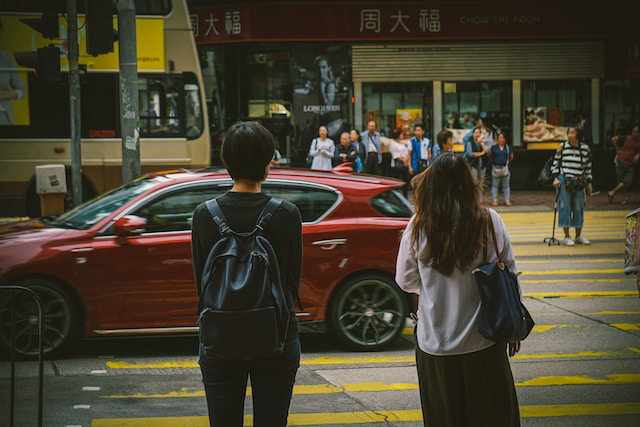

In [74]:
image

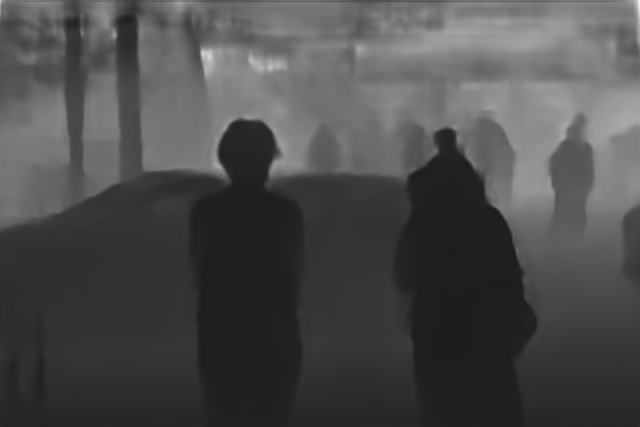

In [75]:
depth

## Task 2 depth image to 3d image

So now lets use depth image to convert 2d image to 3d image with both plotly and matplotlib

#### matplotlib

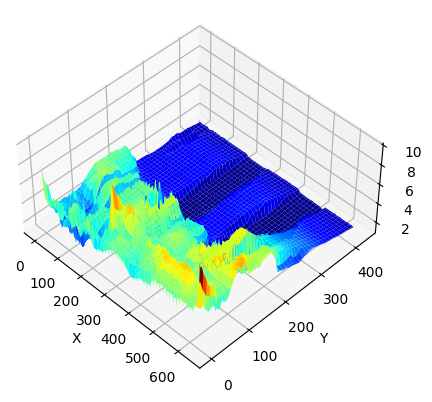

In [76]:


# Assuming 'depth' is the depth image obtained from your code
# Convert the depth image to a numpy array
depth_array = np.array(depth)

# Define the grid coordinates
x, y = np.meshgrid(np.arange(depth_array.shape[1]), np.arange(depth_array.shape[0]))

# Scale the depth values to a suitable range
scaled_depth = depth_array / np.max(depth_array) * 10  # Adjust the scaling factor as needed

# Plot the 3D surface
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
ax.plot_surface(x, y, scaled_depth, cmap='jet')

# Set the axes labels
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')

# Adjust the view angle and aspect ratio
ax.view_init(elev=45, azim=-45)
ax.set_box_aspect([1, 1, 0.5])  # Adjust the aspect ratio as needed

# Show the 3D plot
plt.show()

#### plotly

In [77]:
# Assuming 'depth' is the depth image obtained from your code
# Convert the depth image to a numpy array
depth_array = np.array(depth)

# Define the grid coordinates
x, y = np.meshgrid(np.arange(depth_array.shape[1]), np.arange(depth_array.shape[0]))

# Scale the depth values to a suitable range
scaled_depth = depth_array / np.max(depth_array) * 10  # Adjust the scaling factor as needed

# Create the 3D scatter plot
fig = go.Figure(data=[go.Scatter3d(x=x.flatten(), y=y.flatten(), z=scaled_depth.flatten(),
                                   mode='markers', marker=dict(color=scaled_depth.flatten(), colorscale='Jet', size=2))])

# Set the axes labels
fig.update_layout(scene=dict(xaxis_title='X', yaxis_title='Y', zaxis_title='Z'))

# Adjust the camera position and aspect ratio
camera = dict(
    eye=dict(x=-1.5, y=-1.5, z=0.5),  # Adjust the camera position as needed
    up=dict(x=0, y=0, z=1)
)
fig.update_layout(scene_camera=camera)
fig.update_layout(scene_aspectmode='data')  # Set the aspect ratio to match the data

# Show the 3D plot
fig.show()

## Task 3 Topography Creation

In this task I will try to create a topography.

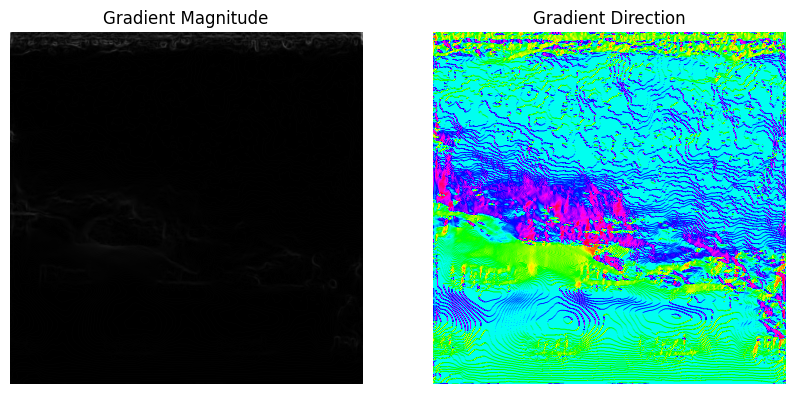

In [78]:

# Compute the gradients
#image_np = cv2.cvtColor(image_np, cv2.COLOR_RGB2GRAY)

gradient_x = cv2.Sobel(image_np, cv2.CV_64F, 1, 0, ksize=3)
gradient_y = cv2.Sobel(image_np, cv2.CV_64F, 0, 1, ksize=3)

# Compute the magnitude and direction of the gradients
gradient_magnitude = np.sqrt(gradient_x**2 + gradient_y**2)
gradient_direction = np.arctan2(gradient_y, gradient_x)

# Visualize the results
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.imshow(gradient_magnitude, cmap='gray')
plt.title('Gradient Magnitude')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(gradient_direction, cmap='hsv')
plt.title('Gradient Direction')
plt.axis('off')

plt.show()

## Task 4 Pattern Detection

and of course try to do basic pattern detection.

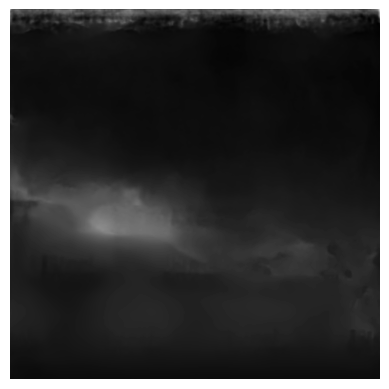

In [79]:
# Perform edge detection using the Canny edge detector
edges = cv2.Canny(image_np, 50, 150)

# Detect circles using the Hough Circle Transform
circles = cv2.HoughCircles(edges, cv2.HOUGH_GRADIENT, dp=1, minDist=50,
                           param1=50, param2=30, minRadius=10, maxRadius=100)

if circles is not None:
    circles = np.uint16(np.around(circles))
    for circle in circles[0, :]:
        center = (circle[0], circle[1])
        radius = circle[2]
        cv2.circle(image_np, center, radius, (0, 255, 0), 2)

# Detect lines using the Hough Line Transform
lines = cv2.HoughLinesP(edges, rho=1, theta=np.pi / 180, threshold=100, minLineLength=100, maxLineGap=10)

if lines is not None:
    for line in lines:
        x1, y1, x2, y2 = line[0]
        cv2.line(image_np, (x1, y1), (x2, y2), (0, 0, 255), 2)

# Detect rectangles using the Hough Rectangle Transform
contours, _ = cv2.findContours(edges, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

for contour in contours:
    perimeter = cv2.arcLength(contour, True)
    approx = cv2.approxPolyDP(contour, 0.02 * perimeter, True)
    if len(approx) == 4:
        cv2.drawContours(image_np, [approx], 0, (255, 0, 0), 2)

# Visualize the results
plt.imshow(image_np, cmap='gray')
plt.axis('off')
plt.show()